# Beard Removal Dataset Generation Demo
This notebook demonstrates how to use the StableDiffusionGenerator to create paired images (with and without beard) and generate a full dataset.

In [ ]:
# Clone the project repository if running in Colab (uncomment if needed)
#!git clone https://github.com/ErayOnder/AI-BeardRemoval-Project.git
#%cd AI-BeardRemoval-Project
#%pip install -r requirements.txt

## Configuration

In [1]:
# Python Standard Libraries
import sys
import os
import random
import argparse # For creating argument Namespace
from pathlib import Path

# Third-party Libraries
from PIL import Image
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader # DataLoader is used in train.py, but good to have if needed directly
import torchvision.transforms as T # For metrics cell if transforming PIL images
from tqdm import tqdm # tqdm is used in train.py

# Check if running in Google Colab
def is_colab():
    try:
        import google.colab
        return True
    except ImportError:
        return False

# Configure environment based on runtime
if is_colab():
    print("Running in Google Colab environment")
    from google.colab import drive
    drive.mount('/content/drive')
    # Set output directory in Google Drive
    output_dir = '/content/drive/MyDrive/beard_dataset'
    pix2pix_checkpoint_dir = '/content/drive/MyDrive/beard_removal_models'
else:
    print("Running in local environment")
    # Set output directory locally
    output_dir = 'dataset'
    pix2pix_checkpoint_dir = 'models'

# --- Project-specific imports ---
# Ensure the project root is in the Python path
# This assumes your notebook is in the 'AI-BeardRemoval-Project' root after %cd
if "." not in sys.path:
    sys.path.append(".")

from utils.stable_diffusion_helper import StableDiffusionGenerator
from training.dataset import BeardDataset # Used by train.py
from training.models import UNetGenerator, PatchDiscriminator # Used by train.py and inference.py
from training.losses import gan_loss, l1 # Used by train.py
from training.train import train # The main training script function
from testing.metrics import compute_ssim, compute_psnr
from testing.inference import predict

print("All modules imported successfully.")

# --- Configuration ---
# Create directories
os.makedirs(output_dir, exist_ok=True)
os.makedirs(pix2pix_checkpoint_dir, exist_ok=True)

print(f"Dataset directory: {output_dir}")
print(f"Model checkpoints will be saved in: {pix2pix_checkpoint_dir}")

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu")
print(f"Using device: {device}")

Running in local environment
All modules imported successfully.
Dataset directory: dataset
Model checkpoints will be saved in: models
Using device: mps


## Dataset Generation

In [2]:
# Initialize the Stable Diffusion generator
# This might take some time to download models if run for the first time
print("Initializing StableDiffusionGenerator...")
sd_generator = StableDiffusionGenerator()
print("StableDiffusionGenerator initialized.")

# Generate the dataset
# This will save images to the 'output_dir' on your Google Drive
num_dataset_pairs = 100  # Number of image pairs for the dataset
test_set_split = 0.2    # 20% for the test set

print(f"Generating dataset with {num_dataset_pairs} pairs to {output_dir}...")
sd_generator.generate_dataset(
    num_pairs=num_dataset_pairs,
    test_split=test_set_split,
    output_dir=output_dir,
    use_face_detection=True # Set to False if face_recognition causes issues or for faster generation
)
print("Dataset generation complete.")

# Verify dataset structure (optional)
train_beard_count = len(list(Path(output_dir, "train", "beard").glob("*.png")))
train_nobeard_count = len(list(Path(output_dir, "train", "no_beard").glob("*.png")))
test_beard_count = len(list(Path(output_dir, "test", "beard").glob("*.png")))
test_nobeard_count = len(list(Path(output_dir, "test", "no_beard").glob("*.png")))

print(f"Train beard images: {train_beard_count}")
print(f"Train no_beard images: {train_nobeard_count}")
print(f"Test beard images: {test_beard_count}")
print(f"Test no_beard images: {test_nobeard_count}")

if train_beard_count == 0 or test_beard_count == 0:
    print("Warning: Dataset seems empty. Check the generation process and paths.")

INFO:utils.stable_diffusion_helper:Using device: mps


Initializing StableDiffusionGenerator...


Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00, 25.08it/s]
INFO:utils.stable_diffusion_helper:Successfully loaded Stable Diffusion models
INFO:utils.stable_diffusion_helper:Found 80 existing training pairs and 20 existing test pairs
INFO:utils.stable_diffusion_helper:Dataset generation complete! Total pairs: 100 (Train: 80, Test: 20)


StableDiffusionGenerator initialized.
Generating dataset with 100 pairs to dataset...
Dataset generation complete.
Train beard images: 80
Train no_beard images: 80
Test beard images: 20
Test no_beard images: 20


#### Generate 10 Sample Paired Images

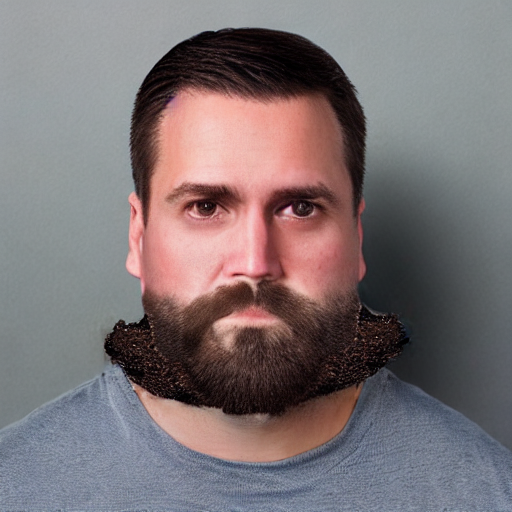

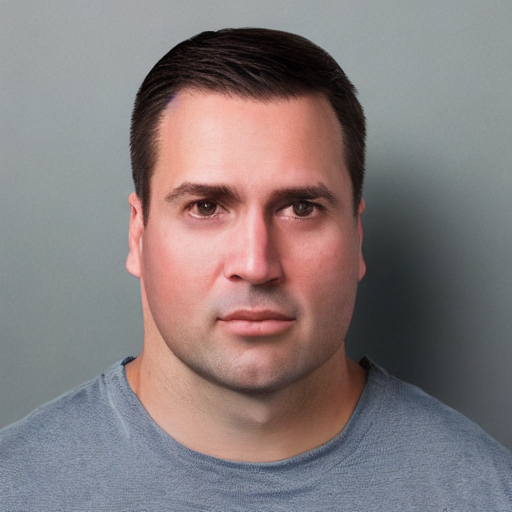

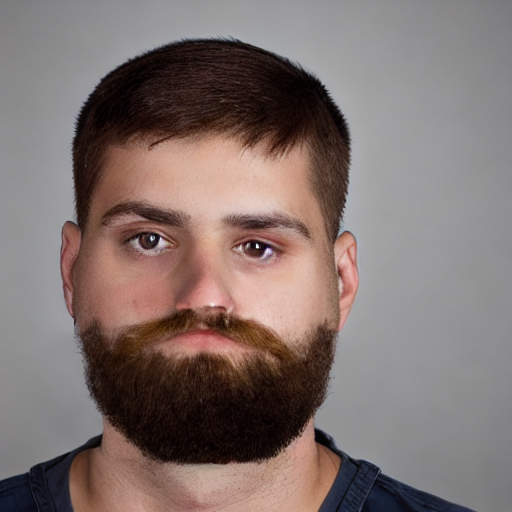

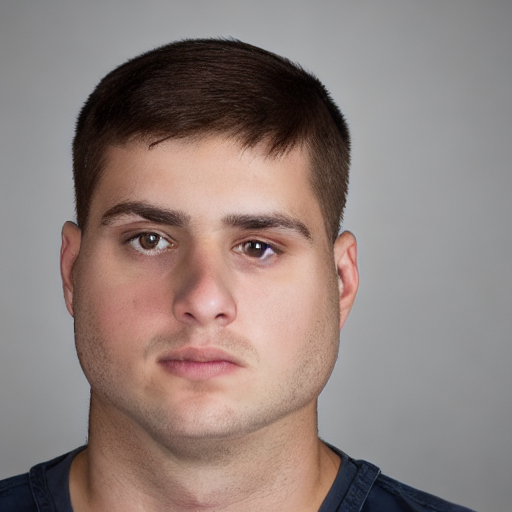

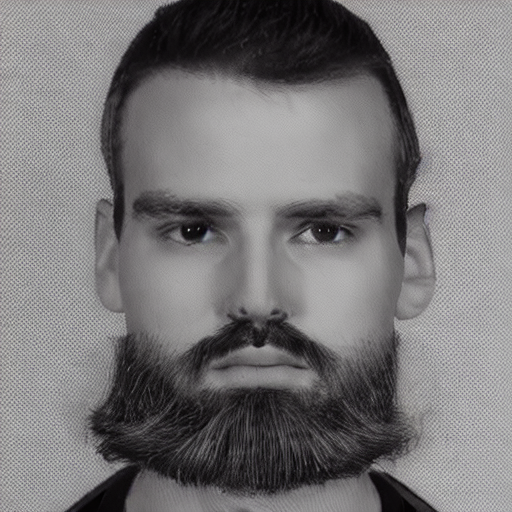

...

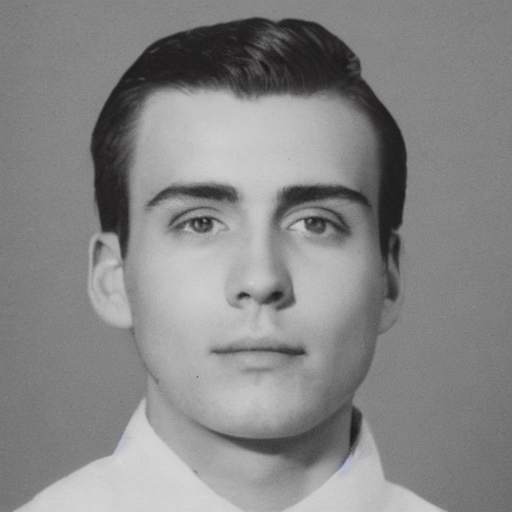

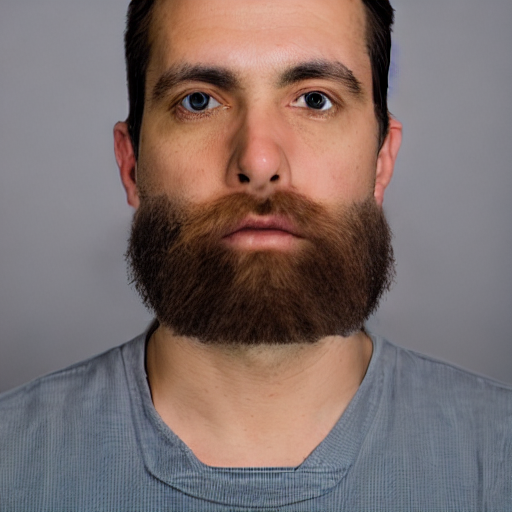

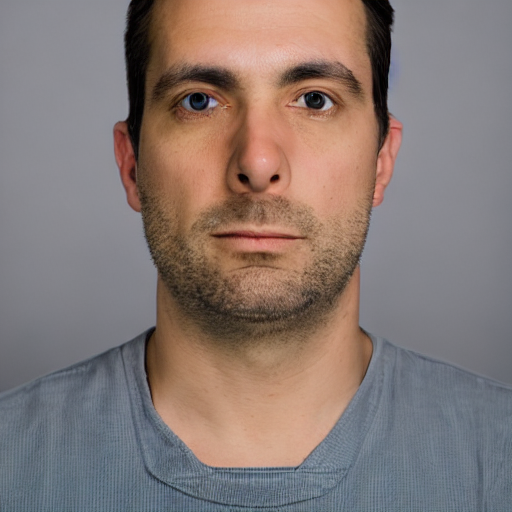

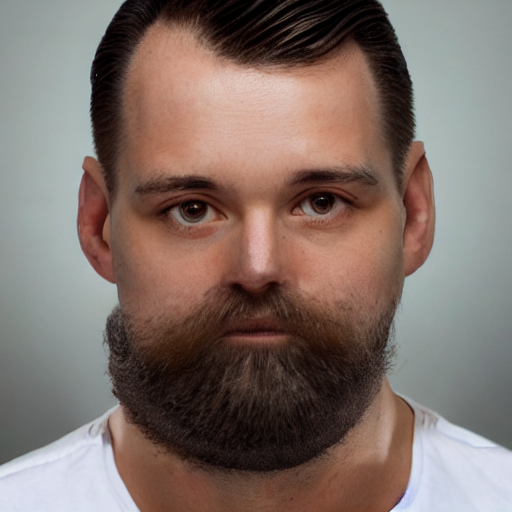

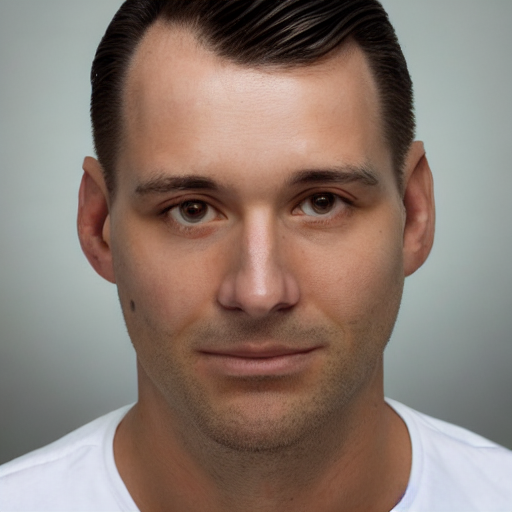

In [5]:
# List all available pairs in train/beard
beard_dir = os.path.join(output_dir, "train", "beard")
no_beard_dir = os.path.join(output_dir, "train", "no_beard")

beard_files = [f for f in os.listdir(beard_dir) if f.endswith('_beard.png')]

# Randomly select 10 pairs
sample_files = random.sample(beard_files, min(10, len(beard_files)))

for f in sample_files:
    beard_path = os.path.join(beard_dir, f)
    nobeard_path = os.path.join(no_beard_dir, f.replace('_beard.png', '_nobeard.png'))
    if os.path.exists(beard_path) and os.path.exists(nobeard_path):
        display(Image.open(beard_path))
        display(Image.open(nobeard_path))

## Model Training

In [3]:
# --- Training Configuration for Pix2Pix ---
# Create an Namespace object to hold training arguments
train_args = argparse.Namespace(
    epochs=50,  # Number of training epochs (e.g., 50 for demo, 200+ for better results)
    batch_size=1,       # Batch size (Pix2Pix often uses 1 due to U-Net size)
    lr=0.0002,          # Learning rate
    lambda_l1=100.0,    # Weight for L1 loss in the generator
    data_dir=output_dir, # Directory where the 'train' and 'test' splits are located
    checkpoint_dir=pix2pix_checkpoint_dir, # Directory to save model checkpoints
    device=device
)

print("Starting Pix2Pix model training...")
print(f"Training arguments: {train_args}")

# Call the train function
# The train.py script handles model initialization, dataloaders, optimizer, and the training loop.
try:
    train(train_args)
    print("Training finished.")
except Exception as e:
    print(f"An error occurred during training: {e}")
    import traceback
    traceback.print_exc()

INFO:training.dataset:Found 80 image pairs in train set
INFO:training.dataset:Found 20 image pairs in test set


Starting Pix2Pix model training...
Training arguments: Namespace(epochs=50, batch_size=1, lr=0.0002, lambda_l1=100.0, data_dir='dataset', checkpoint_dir='models', device=device(type='mps'))
Using device: mps


Epoch 1/50: 100%|██████████| 80/80 [00:55<00:00,  1.45it/s, D_loss=0.689, G_loss=15.2, G_GAN=0.808, G_L1=14.4]



Validation - SSIM: 0.7242, PSNR: 21.9697


Epoch 2/50: 100%|██████████| 80/80 [00:34<00:00,  2.31it/s, D_loss=0.666, G_loss=11.4, G_GAN=0.855, G_L1=10.5]



Validation - SSIM: 0.7820, PSNR: 22.7426


Epoch 3/50: 100%|██████████| 80/80 [00:36<00:00,  2.20it/s, D_loss=0.665, G_loss=10.2, G_GAN=0.85, G_L1=9.34] 



Validation - SSIM: 0.7637, PSNR: 21.1703


Epoch 4/50: 100%|██████████| 80/80 [00:36<00:00,  2.21it/s, D_loss=0.651, G_loss=9.65, G_GAN=0.902, G_L1=8.75]



Validation - SSIM: 0.7640, PSNR: 19.3383


Epoch 5/50: 100%|██████████| 80/80 [00:35<00:00,  2.28it/s, D_loss=0.632, G_loss=9.29, G_GAN=0.944, G_L1=8.35]



Validation - SSIM: 0.7979, PSNR: 21.0704


Epoch 6/50: 100%|██████████| 80/80 [00:36<00:00,  2.21it/s, D_loss=0.593, G_loss=9.3, G_GAN=1.16, G_L1=8.14]  



Validation - SSIM: 0.8201, PSNR: 23.2083


Epoch 7/50: 100%|██████████| 80/80 [00:42<00:00,  1.90it/s, D_loss=0.597, G_loss=8.87, G_GAN=1.06, G_L1=7.81] 



Validation - SSIM: 0.8022, PSNR: 21.3591


Epoch 8/50: 100%|██████████| 80/80 [00:36<00:00,  2.18it/s, D_loss=0.62, G_loss=8.61, G_GAN=1.01, G_L1=7.6]  



Validation - SSIM: 0.8142, PSNR: 22.2381


Epoch 9/50: 100%|██████████| 80/80 [00:36<00:00,  2.19it/s, D_loss=0.616, G_loss=8.5, G_GAN=0.992, G_L1=7.51] 



Validation - SSIM: 0.8266, PSNR: 23.5448


Epoch 10/50: 100%|██████████| 80/80 [00:36<00:00,  2.22it/s, D_loss=0.631, G_loss=8.3, G_GAN=1, G_L1=7.3]      



Validation - SSIM: 0.8243, PSNR: 22.8844


Epoch 11/50: 100%|██████████| 80/80 [00:40<00:00,  1.99it/s, D_loss=0.621, G_loss=8.08, G_GAN=1, G_L1=7.08]    



Validation - SSIM: 0.8392, PSNR: 24.1786


Epoch 12/50: 100%|██████████| 80/80 [00:40<00:00,  1.97it/s, D_loss=0.621, G_loss=7.85, G_GAN=1.01, G_L1=6.84] 



Validation - SSIM: 0.8422, PSNR: 24.5251


Epoch 13/50: 100%|██████████| 80/80 [00:40<00:00,  1.98it/s, D_loss=0.638, G_loss=7.62, G_GAN=0.982, G_L1=6.64]



Validation - SSIM: 0.8328, PSNR: 23.7056


Epoch 14/50: 100%|██████████| 80/80 [00:40<00:00,  1.97it/s, D_loss=0.617, G_loss=7.46, G_GAN=0.985, G_L1=6.48]



Validation - SSIM: 0.8489, PSNR: 24.4272


Epoch 15/50: 100%|██████████| 80/80 [00:41<00:00,  1.92it/s, D_loss=0.619, G_loss=7.29, G_GAN=0.969, G_L1=6.32]



Validation - SSIM: 0.8422, PSNR: 24.1422


Epoch 16/50: 100%|██████████| 80/80 [00:40<00:00,  2.00it/s, D_loss=0.623, G_loss=7.32, G_GAN=0.992, G_L1=6.33]



Validation - SSIM: 0.8543, PSNR: 23.7952


Epoch 17/50: 100%|██████████| 80/80 [00:39<00:00,  2.03it/s, D_loss=0.634, G_loss=7.06, G_GAN=0.968, G_L1=6.09]



Validation - SSIM: 0.8517, PSNR: 23.8584


Epoch 18/50: 100%|██████████| 80/80 [00:40<00:00,  2.00it/s, D_loss=0.633, G_loss=7.01, G_GAN=0.966, G_L1=6.04]



Validation - SSIM: 0.8486, PSNR: 24.1874


Epoch 19/50: 100%|██████████| 80/80 [00:40<00:00,  1.95it/s, D_loss=0.619, G_loss=6.89, G_GAN=0.976, G_L1=5.92]



Validation - SSIM: 0.8464, PSNR: 24.0951


Epoch 20/50: 100%|██████████| 80/80 [00:42<00:00,  1.88it/s, D_loss=0.645, G_loss=6.8, G_GAN=0.975, G_L1=5.82] 



Validation - SSIM: 0.8468, PSNR: 22.6788
Saved checkpoint: models/generator_epoch_020.pth


Epoch 21/50: 100%|██████████| 80/80 [00:41<00:00,  1.95it/s, D_loss=0.629, G_loss=6.6, G_GAN=0.952, G_L1=5.65] 



Validation - SSIM: 0.8504, PSNR: 24.4405


Epoch 22/50:  75%|███████▌  | 60/80 [00:30<00:10,  1.95it/s, D_loss=0.633, G_loss=6.64, G_GAN=0.977, G_L1=5.67]


KeyboardInterrupt: 

# Inference

In [ ]:
print("Running inference with the trained model...")

# --- Inference Configuration ---
# Path to a sample input image from the test set
test_beard_dir = Path(output_dir) / "test" / "beard"
sample_image_files = list(test_beard_dir.glob("*_beard.png"))

if not sample_image_files:
    print(f"No images found in {test_beard_dir}. Cannot run inference.")
    sample_image_path = None
else:
    sample_image_path = str(random.choice(sample_image_files)) # Pick a random test image
    print(f"Using sample image: {sample_image_path}")

# Path to the trained generator model checkpoint
# The training script saves checkpoints like 'generator_epoch_0XX.pth'
# For 50 epochs, last checkpoint will be generator_epoch_040.pth (if saving every 20)
# Or find the latest one if a specific one is not preferred.
trained_model_path = None
potential_checkpoints = sorted(list(Path(pix2pix_checkpoint_dir).glob("generator_epoch_*.pth")))
if potential_checkpoints:
    trained_model_path = str(potential_checkpoints[-1]) # Use the latest checkpoint
    print(f"Using model checkpoint: {trained_model_path}")
else:
    print(f"No model checkpoints found in {pix2pix_checkpoint_dir}. Cannot run inference.")


if sample_image_path and trained_model_path:
    try:
        # Perform prediction using the predict function from testing.inference
        predicted_pil_image = predict(img_path=sample_image_path, model_path=trained_model_path, device=device)

        # Display the original and predicted images
        original_pil_image = Image.open(sample_image_path).convert("RGB")

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(original_pil_image)
        axes[0].set_title("Original (With Beard)")
        axes[0].axis("off")

        axes[1].imshow(predicted_pil_image)
        axes[1].set_title("Predicted (No Beard)")
        axes[1].axis("off")
        plt.suptitle("Beard Removal Inference", fontsize=16)
        plt.show()

        # Optionally, save the predicted image
        save_path = Path(output_dir) / "predicted_sample_image.png"
        predicted_pil_image.save(save_path)
        print(f"Predicted image saved to: {save_path}")

    except Exception as e:
        print(f"An error occurred during inference: {e}")
        import traceback
        traceback.print_exc()
else:
    print("Skipping inference due to missing sample image or model checkpoint.")